<a href="https://colab.research.google.com/github/aliya-fatma011/Deep-Learning/blob/main/Cassava_efficient_net_v2s3)_(2)_(1).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:

from google.colab import drive
drive.mount('/content/drive')

import os



Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
dataset_path = '/content/dataset_sir'

In [ ]:
print("Contents of /content/drive/MyDrive:")
!ls -F "/content/drive/MyDrive/"

Contents of /content/drive/MyDrive:
'Colab Notebooks'/   main_dataset/   mobilev3small_casava.ipynb


In [ ]:
print("Contents of /content/:")
!ls -F "/content/"

Contents of /content/:
drive/	sample_data/


In [ ]:
import pandas as pd

In [ ]:
# REMOVE BROKEN NUMPY
!pip uninstall -y numpy

# CLEAR PIP CACHE
!pip cache purge

# INSTALL FRESH NUMPY
!pip install numpy==1.26.4 --no-cache-dir

# INSTALL REQUIRED LIBRARIES
!pip install scipy==1.13.1 scikit-learn==1.5.2 seaborn==0.13.2 --no-cache-dir

print("DONE")
print("NOW RESTART RUNTIME")

Found existing installation: numpy 2.4.4
Uninstalling numpy-2.4.4:
  Successfully uninstalled numpy-2.4.4
Files removed: 10
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.0/61.0 kB 82.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.0/18.0 MB 131.9 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-colab 1.0.0 requires pandas==2.2.2, but you have pandas 3.0.3 which is incompatible.
access 1.1.10.post3 requires scipy>=1.14.1, but you have scipy 1.13.1 which is incompatible.
shap 0.51.0 requires numpy>=2, but you have numpy 1.26.4 which is incompatible.
cupy-cuda12x 14.0.1 requires numpy<2.6,>=2.0, but you have numpy 1.26.4 which is incompatible.
cudf-cu12 26.2.1 requires pandas<2.4.0,>=2.0, but you have pandas 3.0.3 which is incompatible.
xarray-einstats 0.10.0 requires numpy>=2.0, but you have numpy 1.26.4 which is incomp

DONE
NOW RESTART RUNTIME


In [ ]:
import numpy as np
print(np.__version__)

import sklearn
print(sklearn.__version__)

1.26.4
1.5.2


In [ ]:
# =========================================================
# STANDARD IMPORTS
# =========================================================

import os
import json
import random
import warnings

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import matplotlib.cm as cm
import seaborn as sns

import tensorflow as tf

from PIL import Image

# =========================================================
# SKLEARN
# =========================================================

from sklearn.model_selection import train_test_split

from sklearn.utils.class_weight import compute_class_weight

from sklearn.metrics import (
    classification_report,
    confusion_matrix
)

# =========================================================
# TENSORFLOW / KERAS
# =========================================================

from tensorflow.keras.applications import EfficientNetV2S

from tensorflow.keras.applications.efficientnet_v2 import (
    preprocess_input
)

from tensorflow.keras.layers import (
    Input,
    Dense,
    Dropout,
    BatchNormalization,
    GlobalAveragePooling2D
)

from tensorflow.keras.models import Model

from tensorflow.keras.regularizers import l2

from tensorflow.keras.callbacks import (
    EarlyStopping,
    ReduceLROnPlateau,
    ModelCheckpoint
)

from tensorflow.keras.preprocessing.image import (
    ImageDataGenerator
)

# =========================================================
# SETTINGS
# =========================================================

warnings.filterwarnings("ignore")

print("TensorFlow Version :", tf.__version__)
print("NumPy Version      :", np.__version__)
print("GPU Available      :", tf.config.list_physical_devices('GPU'))

TensorFlow Version : 2.20.0
NumPy Version      : 1.26.4
GPU Available      : [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


In [ ]:
MAIN_DATASET_PATH = '/content/drive/MyDrive/main_dataset/dataset_sir/main_dataset'

TRAIN_CSV = MAIN_DATASET_PATH + "/Train/Train.csv"
TRAIN_DIR = MAIN_DATASET_PATH + "/Train/Train_Images_clean"

TEST_CSV = MAIN_DATASET_PATH + "/Test/Test.csv"
TEST_DIR = MAIN_DATASET_PATH + "/Test/Test_Images_clean"

LABEL_JSON = MAIN_DATASET_PATH + "/label_num_to_disease_map.json"

In [ ]:
import os

print(os.path.exists(TRAIN_CSV))
print(os.path.exists(TEST_CSV))
print(os.path.exists(TRAIN_DIR))
print(os.path.exists(TEST_DIR))
print(os.path.exists(LABEL_JSON))

True
True
True
True
True


In [ ]:
# =========================================================
# 6. LOAD DATASET
# =========================================================

import json

# --- Diagnostic Step: List contents of main_dataset directory ---
print(f"Contents of {MAIN_DATASET_PATH}:")
!ls -F "{MAIN_DATASET_PATH}"
# ----------------------------------------------------------------

train_df = pd.read_csv(TRAIN_CSV)
test_df = pd.read_csv(TEST_CSV)

with open(LABEL_JSON, 'r') as f:
    label_map = json.load(f)

print('Train Shape :', train_df.shape)
print('Test Shape  :', test_df.shape)

Contents of /content/drive/MyDrive/main_dataset/dataset_sir/main_dataset:
label_num_to_disease_map.json  Test/  Train/
Train Shape : (4000, 2)
Test Shape  : (1000, 2)


In [ ]:
df = pd.read_csv(TRAIN_CSV)

In [ ]:
import os

print("Contents of /content/ (recursive listing):")

# This might produce a lot of output, consider running with !ls -R /content/ if you want to see all
# For a more manageable output, let's just check the top-level directories within /content

for root, dirs, files in os.walk('/content/', topdown=True):
    # Limit depth to avoid excessive output, e.g., only show up to 2 levels deep
    depth = root.count(os.sep) - '/content/'.count(os.sep)
    if depth < 3:
        indent = '    ' * depth
        print(f"{indent}{os.path.basename(root)}/")
        for f in files:
            print(f"{indent}    {f}")

        # If you expect the dataset in a specific subfolder, you can uncomment and adjust this:
        # if 'dataset_sir' in dirs:
        #     print(f"{indent}    Found 'dataset_sir' in {root}")
        #     break # Stop after finding the desired directory


Contents of /content/ (recursive listing):
/
.config/
    hidden_gcloud_config_universe_descriptor_data_cache_configs.db
    .last_opt_in_prompt.yaml
    .last_update_check.json
    active_config
    default_configs.db
    gce
    .last_survey_prompt.yaml
    config_sentinel
    configurations/
        config_default
    logs/
        2026.05.11/
            13.33.16.780782.log
            13.33.05.427475.log
            13.33.27.421087.log
            13.33.15.341401.log
            13.32.46.967578.log
            13.33.26.697226.log
drive/
    MyDrive/
        mobilev3small_casava.ipynb
        Colab Notebooks/
            Untitled0.ipynb
            Untitled1.ipynb
            CassavaNetl_mobilee3)_(2).ipynb
            Untitled2.ipynb
            CassavaNet efficient netlite 0)_(2).ipynb
            Untitled (3)
            Untitled (2)
            Untitled (1)
            CassavaNetl_mobilev3 large3)_(2).ipynb
            Untitled
            CassavaNetl_mobilee_large3)_(2) (1).ip

#Counts the Total Numbers of Labels

In [ ]:
train_df["Labels"] = train_df["Labels"].astype(int)
test_df["Labels"] = test_df["Labels"].astype(int)

num_classes = len(label_map)

print("Number of classes:", num_classes)
print("Train class count:")
print(train_df["Labels"].value_counts())

Number of classes: 5
Train class count:
Labels
3    800
0    800
2    800
4    800
1    800
Name: count, dtype: int64


#Counts Total numbers of Taining and Test Images

In [ ]:
print("Number of classes:", num_classes)

print("\nTotal images:")
print("Train:", len(train_df))
print("Test:", len(test_df))

print("\nClass distribution (Train):")
print(train_df["Labels"].value_counts())

Number of classes: 5

Total images:
Train: 4000
Test: 1000

Class distribution (Train):
Labels
3    800
0    800
2    800
4    800
1    800
Name: count, dtype: int64


#label mapping

In [ ]:
import json

with open(LABEL_JSON, 'r') as f:
    label_map = json.load(f)

print(label_map)

{'0': 'CBB', '1': 'CBSD', '2': 'CGM', '3': 'CMD', '4': 'Healthy'}


Convert labels → actual names

In [ ]:
for k, v in label_map.items():
    print(f"Label {k} → {v}")



Label 0 → CBB
Label 1 → CBSD
Label 2 → CGM
Label 3 → CMD
Label 4 → Healthy


In [ ]:
counts = train_df["Labels"].value_counts().sort_index()

for label, count in counts.items():
    print(f"{label_map[str(label)]} → {count}")

CBB → 800
CBSD → 800
CGM → 800
CMD → 800
Healthy → 800


In [ ]:
print("Train Class Distribution (from DataFrame):")
counts_from_df = train_df["Labels"].value_counts().sort_index()
for label, count in counts_from_df.items():
    print(f"{label_map[str(label)]} → {count}")

Train Class Distribution (from DataFrame):
CBB → 800
CBSD → 800
CGM → 800
CMD → 800
Healthy → 800


In [ ]:
import os

# Correct folders
train_dir = TRAIN_DIR

test_dir = TEST_DIR


# Function to count images
def count_images(folder):

    total = 0

    for root, dirs, files in os.walk(folder):

        images = [
            f for f in files
            if f.lower().endswith(
                ('.png', '.jpg', '.jpeg')
            )
        ]

        total += len(images)

    return total


# Print counts
print("✅ Total Train Clean Images:",
      count_images(train_dir))

print("✅ Total Test Clean Images:",
      count_images(test_dir))

✅ Total Train Clean Images: 4000
✅ Total Test Clean Images: 1000


#Plotting the Barplot to see all the class image

In [ ]:
counts = df["Labels"].value_counts().sort_index()
names = [label_map[str(i)] for i in counts.index]
values = counts.values

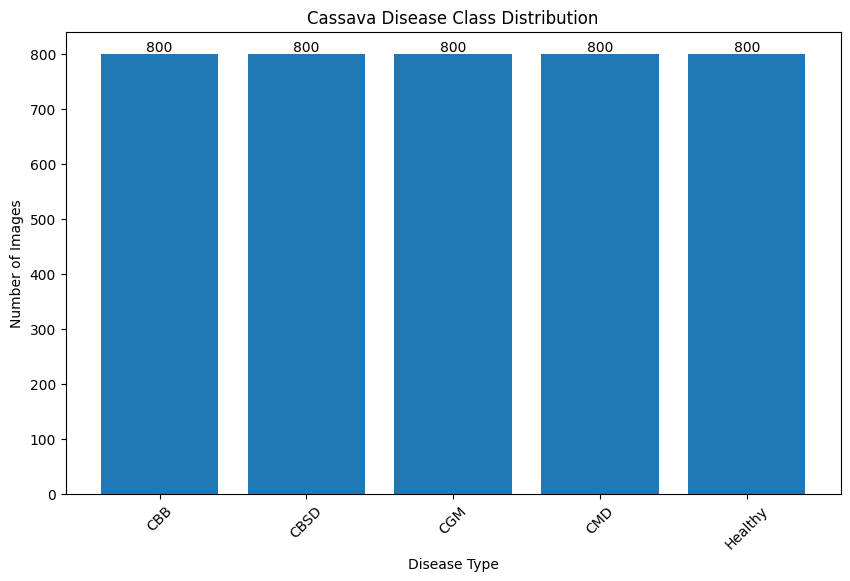

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10,6))

plt.bar(names, values)

plt.title("Cassava Disease Class Distribution")
plt.xlabel("Disease Type")
plt.ylabel("Number of Images")

plt.xticks(rotation=45)

# Add values on top
for i, v in enumerate(values):
    plt.text(i, v + 5, str(v), ha='center')

plt.show()

#Function to Access the single images

In [ ]:
print(train_df["Labels"].unique())
print(train_df["Labels"].dtype)

[3 0 2 4 1]
int64


In [ ]:
import matplotlib.pyplot as plt
from PIL import Image
import os

def show_one_image(class_id):
    # Filter the DataFrame using the integer class_id
    row = train_df[train_df["Labels"] == class_id].iloc[0]

    # Construct the image path directly using TRAIN_DIR and the image ID
    img_path = os.path.join(TRAIN_DIR, row["ID"])
    img = Image.open(img_path)

    plt.imshow(img)
    plt.title(label_map[str(class_id)])
    plt.axis("off")
    plt.show()

In [ ]:
import os

print(f"Contents of TRAIN_DIR ({TRAIN_DIR}):")
# List only the first 10 items to avoid overwhelming output
contents = os.listdir(TRAIN_DIR)
if contents:
    for item in contents[:10]:
        print(item)
else:
    print("TRAIN_DIR is empty or does not exist.")

Contents of TRAIN_DIR (/content/drive/MyDrive/main_dataset/dataset_sir/main_dataset/Train/Train_Images_clean):
3844780526.jpg
3813128079.jpg
384773120.jpg
3810425289.jpg
3845948976.jpg
3793664928.jpg
379958464.jpg
3852514218.jpg
3789353421.jpg
3813620418.jpg


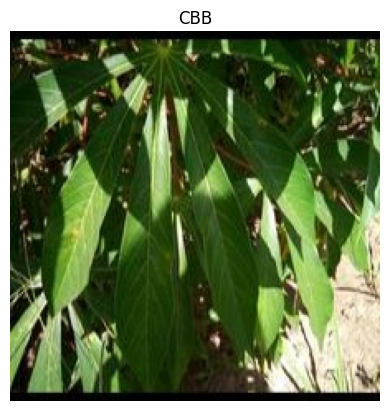

In [ ]:
show_one_image(0)

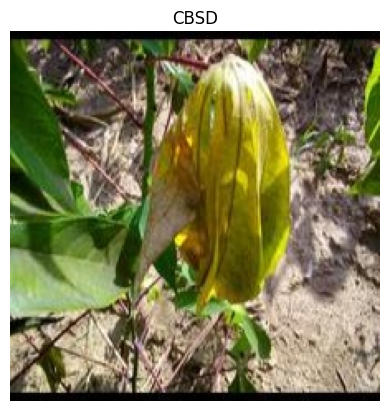

In [ ]:
show_one_image(1)   # change class id

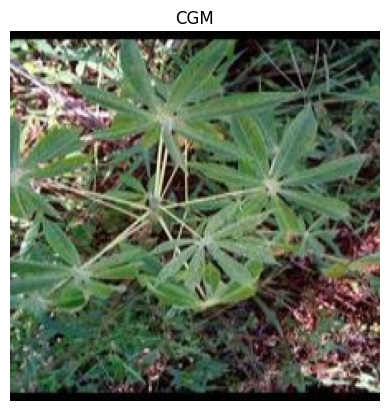

In [ ]:
show_one_image(2)   # change class id

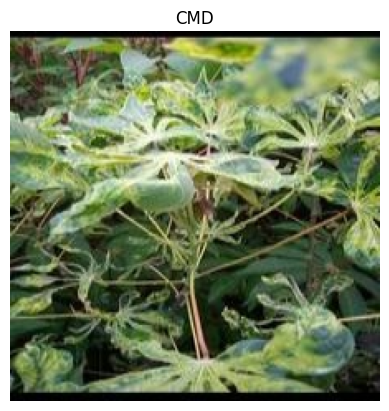

In [ ]:
show_one_image(3)   # change class id

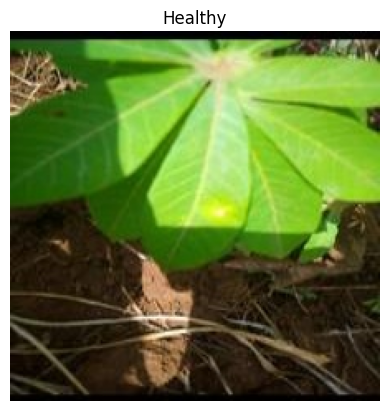

In [ ]:
show_one_image(4)   # change class id

In [ ]:
import cv2
import os

#Function to Access 3 random images from EACH class

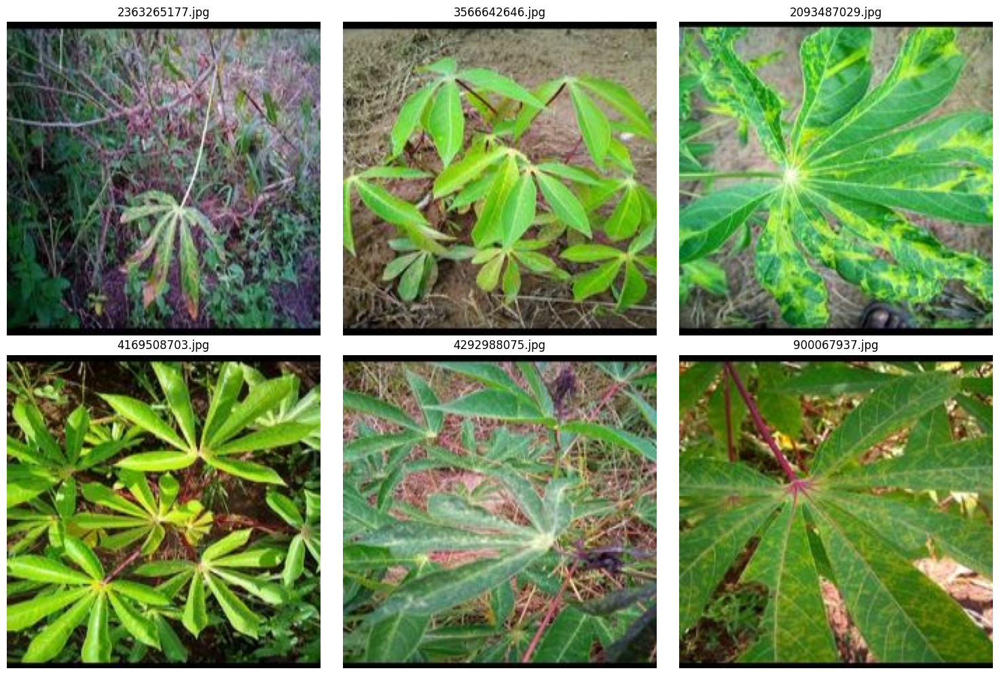

In [ ]:
import matplotlib.pyplot as plt
import os
import cv2
import random

# Folder containing processed images
folder = TRAIN_DIR # Changed from "/content/drive/MyDrive/dataset_sir/main_dataset/Train/Train_Images_clean" to TRAIN_DIR

# Get image files
files = [f for f in os.listdir(folder)
         if f.lower().endswith(('.png', '.jpg', '.jpeg'))]

# Randomly select 6 images
sample_files = random.sample(files, 6)

# Plot images
plt.figure(figsize=(15,10))

for i, file in enumerate(sample_files):

    img_path = os.path.join(folder, file)

    img = cv2.imread(img_path)

    # Convert BGR → RGB
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    plt.subplot(2, 3, i+1)
    plt.imshow(img)
    plt.title(file)
    plt.axis("off")

plt.tight_layout()
plt.show()

#Image preprocessing

In [ ]:
import cv2
import os
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

#Applying image preprocessing on CMD Disease of first image

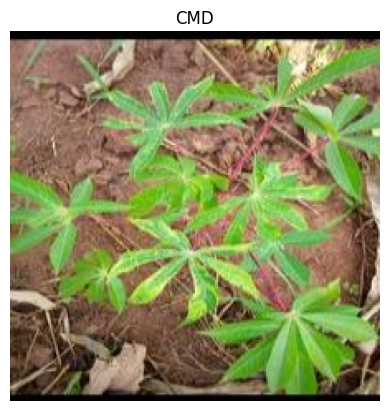

In [ ]:
import matplotlib.pyplot as plt
from PIL import Image
import os

# get one row
row = train_df.iloc[3]

# image path
image_path = os.path.join(TRAIN_DIR, row["ID"])

# label
label_id = row["Labels"]
label_name = label_map[str(label_id)]

# load image
img = Image.open(image_path)

# show image with ONLY class name
plt.imshow(img)
plt.title(label_name)
plt.axis("off")
plt.show()

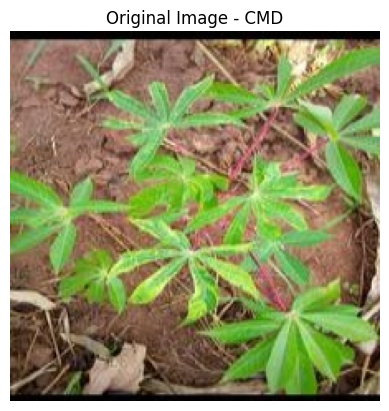

In [ ]:
import cv2
import matplotlib.pyplot as plt

img = cv2.imread(image_path)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

plt.imshow(img)
plt.title(f"Original Image - {label_name}")
plt.axis("off")
plt.show()

Resize Image

In [ ]:
def show_image(title, image, cmap=None):
    plt.figure(figsize=(5,5))
    plt.imshow(image, cmap=cmap)
    plt.title(title)
    plt.axis("off")
    plt.show()

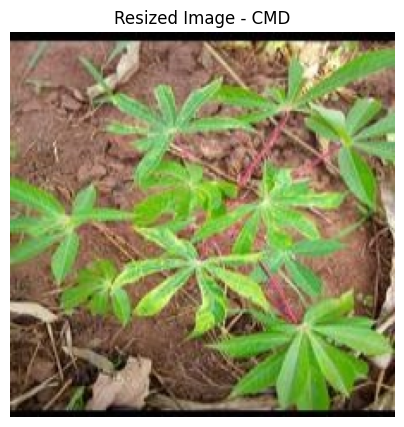

In [ ]:
resized = cv2.resize(img, (224, 224))
show_image(f"Resized Image - {label_name}", resized)

Grayscale

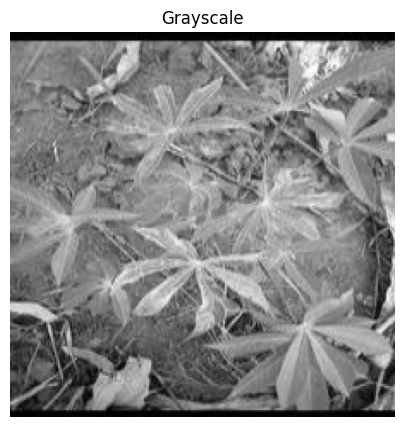

In [ ]:
gray = cv2.cvtColor(resized, cv2.COLOR_RGB2GRAY)
show_image("Grayscale", gray, cmap="gray")



Gaussian BLur

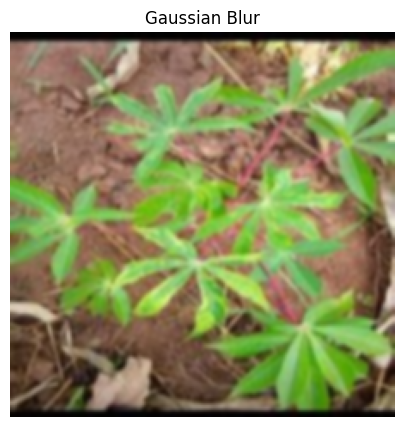

In [ ]:
gaussian_blur = cv2.GaussianBlur(resized, (5, 5), 0)
show_image("Gaussian Blur", gaussian_blur)

Median Blur

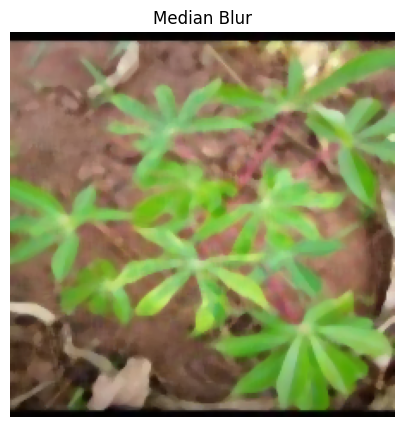

In [ ]:
median_blur = cv2.medianBlur(resized, 5)
show_image("Median Blur", median_blur)

Sharpening

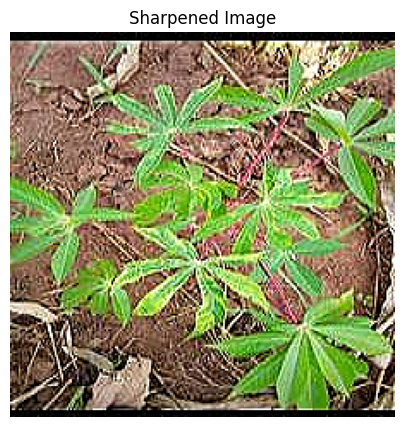

In [ ]:
sharpen_kernel = np.array([
    [0, -1, 0],
    [-1, 5, -1],
    [0, -1, 0]
])

sharpened = cv2.filter2D(resized, -1, sharpen_kernel)
show_image("Sharpened Image", sharpened)

Histogram Equilization

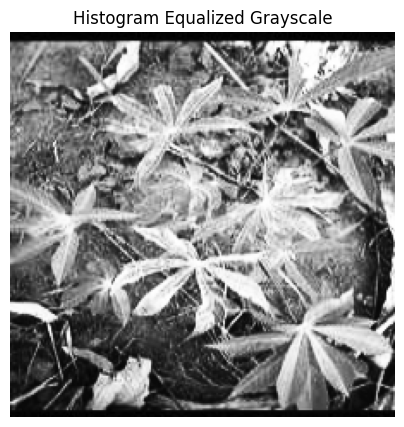

In [ ]:
gray_equalized = cv2.equalizeHist(gray)
show_image("Histogram Equalized Grayscale", gray_equalized, cmap="gray")

CLAHE enhancement

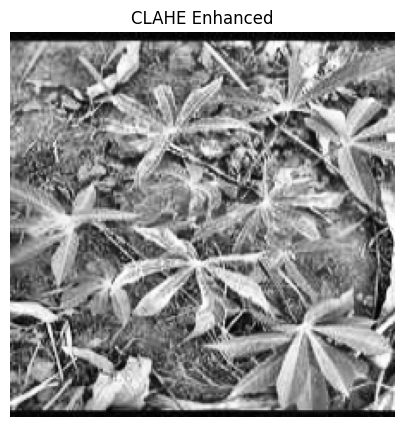

In [ ]:
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
clahe_img = clahe.apply(gray)

show_image("CLAHE Enhanced", clahe_img, cmap="gray")

Canny edge detection

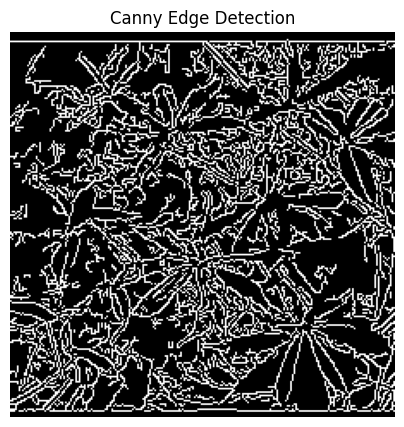

In [ ]:
edges = cv2.Canny(gray, 100, 200)
show_image("Canny Edge Detection", edges, cmap="gray")

Sobel edge detection

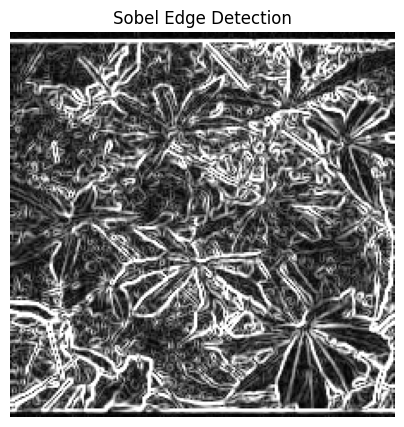

In [ ]:
sobel_x = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=3)
sobel_y = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=3)

sobel = cv2.magnitude(sobel_x, sobel_y)
sobel = np.uint8(np.clip(sobel, 0, 255))

show_image("Sobel Edge Detection", sobel, cmap="gray")




Thresholding

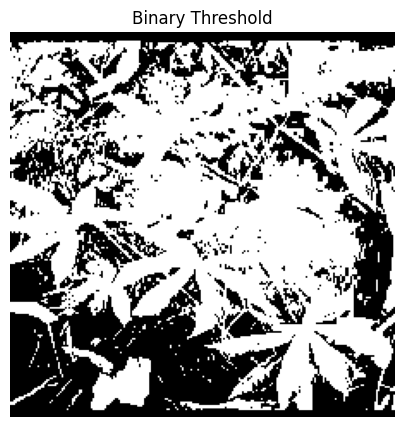

In [ ]:
_, threshold = cv2.threshold(gray, 120, 255, cv2.THRESH_BINARY)
show_image("Binary Threshold", threshold, cmap="gray")

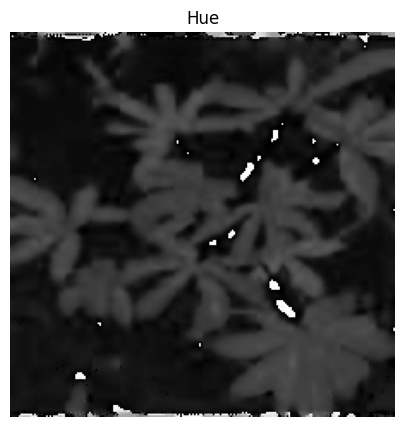

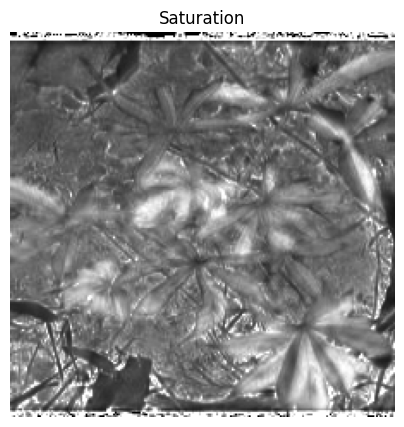

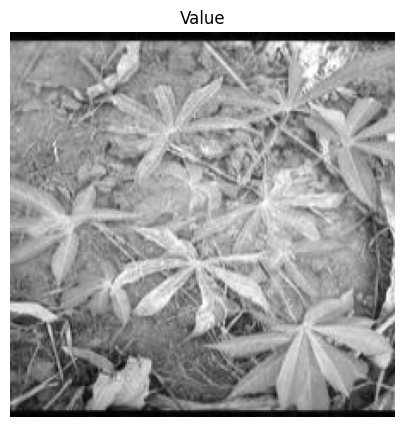

In [ ]:
hsv = cv2.cvtColor(resized, cv2.COLOR_RGB2HSV)
h, s, v = cv2.split(hsv)

show_image("Hue", h, "gray")
show_image("Saturation", s, "gray")
show_image("Value", v, "gray")

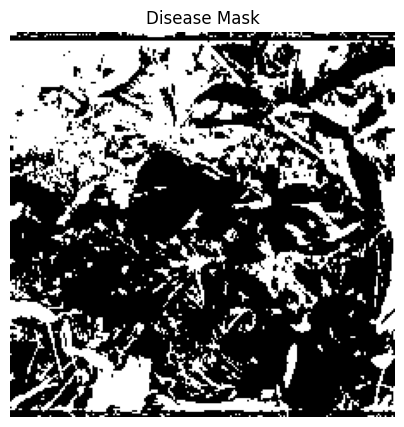

In [ ]:
_, mask = cv2.threshold(s, 100, 255, cv2.THRESH_BINARY_INV)
show_image("Disease Mask", mask, "gray")

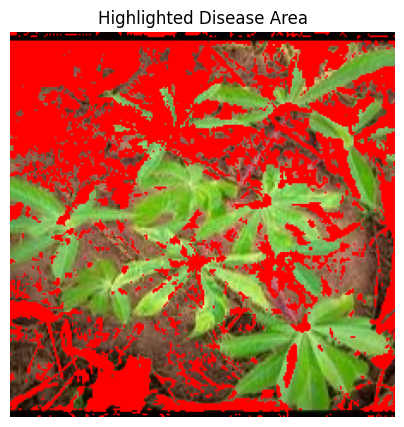

In [ ]:
highlight = resized.copy()
highlight[mask == 255] = [255, 0, 0]

show_image("Highlighted Disease Area", highlight)

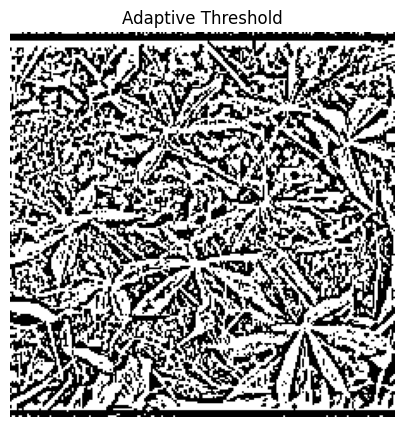

In [ ]:
adaptive_threshold = cv2.adaptiveThreshold(
    gray,
    255,
    cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
    cv2.THRESH_BINARY,
    11,
    2
)

show_image("Adaptive Threshold", adaptive_threshold, cmap="gray")

Morphological operations

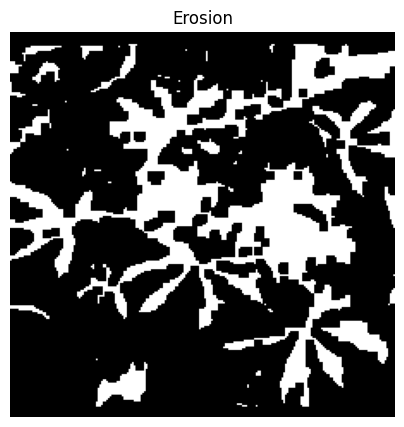

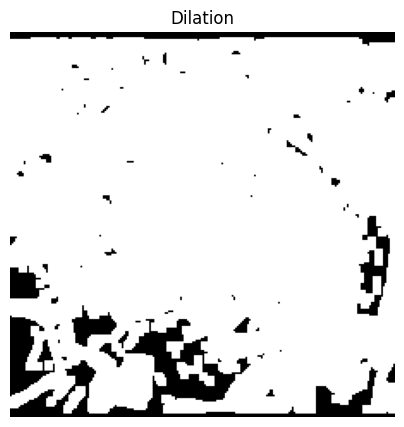

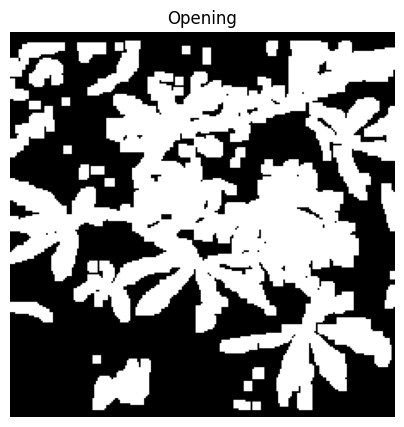

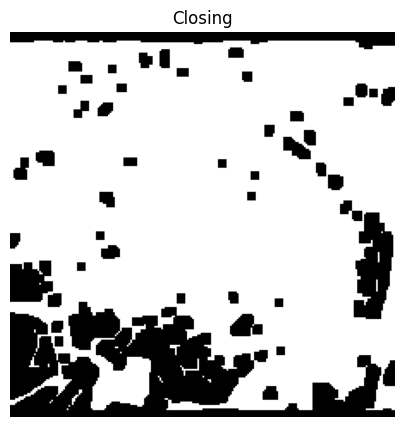

In [ ]:
kernel = np.ones((5,5), np.uint8)

erosion = cv2.erode(threshold, kernel, iterations=1)
dilation = cv2.dilate(threshold, kernel, iterations=1)
opening = cv2.morphologyEx(threshold, cv2.MORPH_OPEN, kernel)
closing = cv2.morphologyEx(threshold, cv2.MORPH_CLOSE, kernel)

show_image("Erosion", erosion, cmap="gray")
show_image("Dilation", dilation, cmap="gray")
show_image("Opening", opening, cmap="gray")
show_image("Closing", closing, cmap="gray")

HSV color space

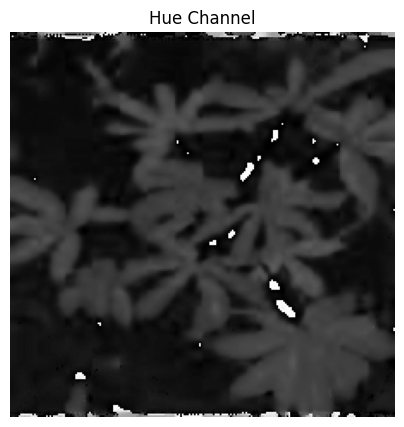

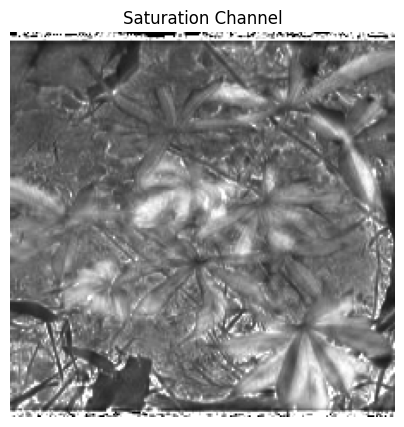

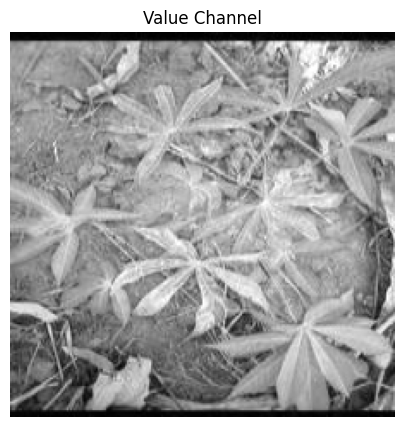

In [ ]:
hsv = cv2.cvtColor(resized, cv2.COLOR_RGB2HSV)

h, s, v = cv2.split(hsv)

show_image("Hue Channel", h, cmap="gray")
show_image("Saturation Channel", s, cmap="gray")
show_image("Value Channel", v, cmap="gray")

RGB histogram

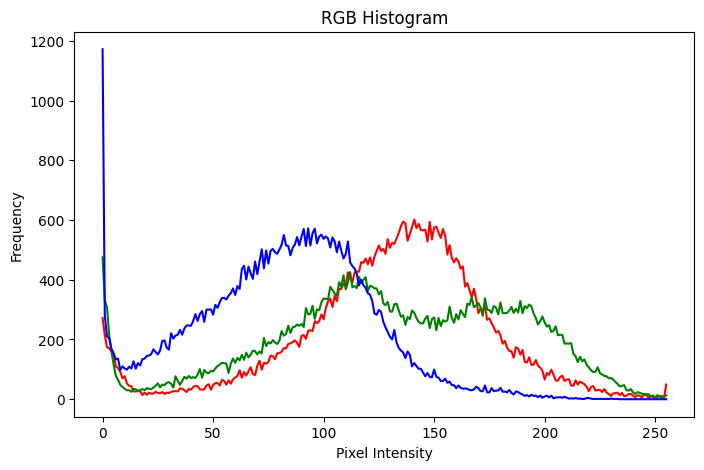

In [ ]:
colors = ("red", "green", "blue")

plt.figure(figsize=(8,5))

for i, color in enumerate(colors):
    hist = cv2.calcHist([resized], [i], None, [256], [0,256])
    plt.plot(hist, color=color)

plt.title("RGB Histogram")
plt.xlabel("Pixel Intensity")
plt.ylabel("Frequency")
plt.show()

Show everything in one grid

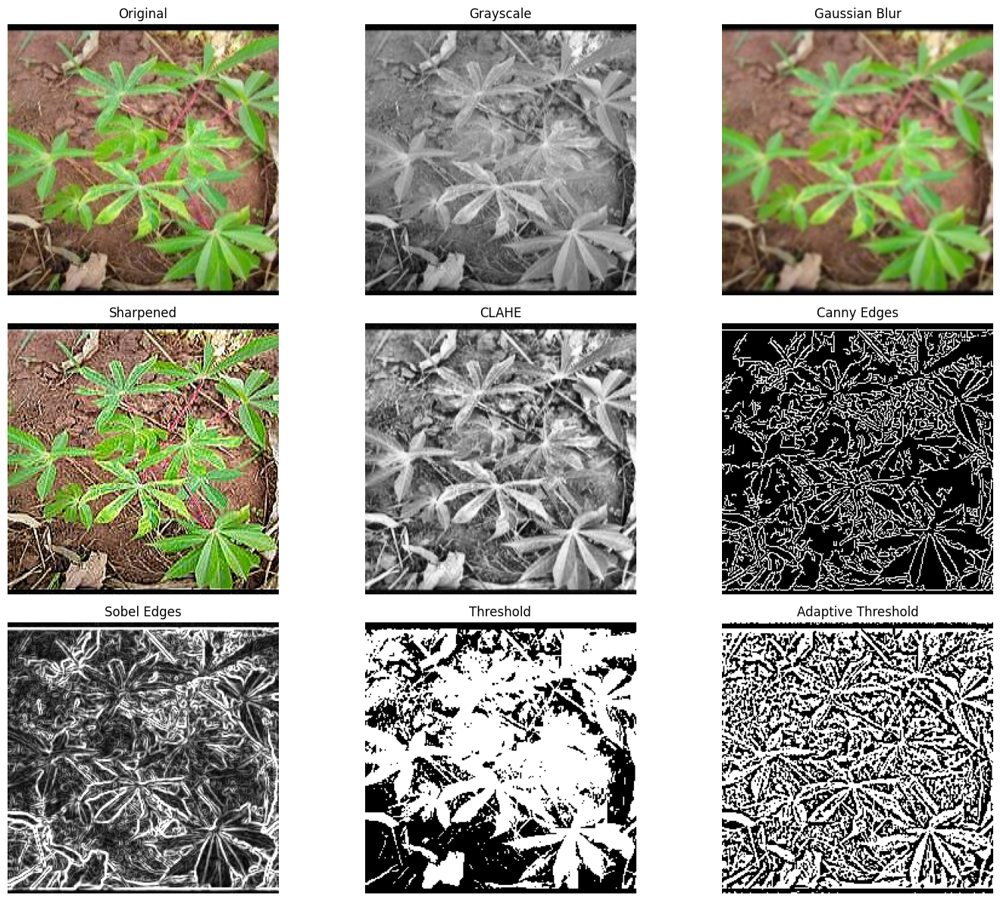

In [ ]:
images = [
    ("Original", resized, None),
    ("Grayscale", gray, "gray"),
    ("Gaussian Blur", gaussian_blur, None),
    ("Sharpened", sharpened, None),
    ("CLAHE", clahe_img, "gray"),
    ("Canny Edges", edges, "gray"),
    ("Sobel Edges", sobel, "gray"),
    ("Threshold", threshold, "gray"),
    ("Adaptive Threshold", adaptive_threshold, "gray")
]

plt.figure(figsize=(15, 12))

for i, (title, image, cmap) in enumerate(images):
    plt.subplot(3, 3, i + 1)
    plt.imshow(image, cmap=cmap)
    plt.title(title)
    plt.axis("off")

plt.tight_layout()
plt.show()

In [ ]:
# STEP 2 — Enable Mixed Precision (2× faster on GPU/TPU)
from tensorflow.keras import mixed_precision
mixed_precision.set_global_policy('mixed_float16')
# float16 for compute, float32 for weights → faster + less VRAM

In [ ]:
# STEP 3 — Reproducibility Seeds
# ─────────────────────────────────────────────────────────────
SEED = 42
os.environ['PYTHONHASHSEED'] = str(SEED)
np.random.seed(SEED)
random.seed(SEED)
tf.random.set_seed(SEED)

In [ ]:
# STEP 4 — Dataset Paths  (taken from YOUR notebook)
# ─────────────────────────────────────────────────────────────
MAIN_DATASET_PATH = (
    '/content/drive/MyDrive/main_dataset/dataset_sir/main_dataset'
)

TRAIN_CSV  = MAIN_DATASET_PATH + '/Train/Train.csv'
TRAIN_DIR  = MAIN_DATASET_PATH + '/Train/Train_Images_clean'
TEST_CSV   = MAIN_DATASET_PATH + '/Test/Test.csv'
TEST_DIR   = MAIN_DATASET_PATH + '/Test/Test_Images_clean'
LABEL_JSON = MAIN_DATASET_PATH + '/label_num_to_disease_map.json'

# Verify all paths exist before continuing
for p in [TRAIN_CSV, TRAIN_DIR, TEST_CSV, TEST_DIR, LABEL_JSON]:
    status = "✅" if os.path.exists(p) else "❌ MISSING"
    print(f"{status} → {p}")

✅ → /content/drive/MyDrive/main_dataset/dataset_sir/main_dataset/Train/Train.csv
✅ → /content/drive/MyDrive/main_dataset/dataset_sir/main_dataset/Train/Train_Images_clean
✅ → /content/drive/MyDrive/main_dataset/dataset_sir/main_dataset/Test/Test.csv
✅ → /content/drive/MyDrive/main_dataset/dataset_sir/main_dataset/Test/Test_Images_clean
✅ → /content/drive/MyDrive/main_dataset/dataset_sir/main_dataset/label_num_to_disease_map.json


In [ ]:
TRAIN_CSV = "/content/train.csv"

TEST_CSV = "/content/test.csv"

In [ ]:
TRAIN_CSV = '/content/drive/MyDrive/main_dataset/dataset_sir/main_dataset/Train/Train.csv'
TEST_CSV = '/content/drive/MyDrive/main_dataset/dataset_sir/main_dataset/Test/Test.csv'

train_df = pd.read_csv(TRAIN_CSV)

test_df = pd.read_csv(TEST_CSV)

print(train_df.head())

               ID  Labels
0  1758913732.jpg       3
1  1241243048.jpg       0
2  3761100385.jpg       2
3  3055614106.jpg       3
4  2386589588.jpg       4


In [ ]:
train_df = pd.read_csv(TRAIN_CSV)

test_df = pd.read_csv(TEST_CSV)

print(train_df.head())

               ID  Labels
0  1758913732.jpg       3
1  1241243048.jpg       0
2  3761100385.jpg       2
3  3055614106.jpg       3
4  2386589588.jpg       4


In [ ]:
# STEP 5 — Hyperparameters (all in one place — easy to tune)
IMG_SIZE          = 224    # EfficientNetV2S native size (224–384 works)
BATCH_SIZE        = 32     # 32 is good for GPU; use 16 for low VRAM
EPOCHS_HEAD       = 10     # Phase-1: only top layers train
EPOCHS_FINE       = 20     # Phase-2: fine-tune last N base layers
LR_HEAD           = 1e-3   # Higher LR for fresh head layers (Adam)
LR_FINE           = 1e-5   # Very low LR for fine-tuning (prevents forgetting)
DROPOUT_RATE      = 0.4    # Regularization — drops 40% of neurons
L2_REG            = 1e-4   # Weight decay — penalizes large weights
DENSE_UNITS_1     = 512    # Neurons in first dense layer
                            #   Rule: start at 512 or 256 for 5-class problems
                            #   = 2^N between (num_classes × 10) and 1024
DENSE_UNITS_2     = 256    # Second dense layer (optional — adds depth)
LABEL_SMOOTHING   = 0.1    # Prevents overconfident softmax predictions
UNFREEZE_FROM     = -30    # Fine-tune last 30 layers of EfficientNetV2S

In [ ]:

# ─────────────────────────────────────────────────────────────
# STEP 6 — Load CSVs & Label Map
# ─────────────────────────────────────────────────────────────
train_df = pd.read_csv(TRAIN_CSV)
test_df  = pd.read_csv(TEST_CSV)

with open(LABEL_JSON, 'r') as f:
    label_map = json.load(f)   # e.g. {"0": "Cassava Bacterial Blight", ...}

# Ensure Labels column is integer then string (needed by ImageDataGenerator)
train_df['Labels'] = train_df['Labels'].astype(int)

print(f"Train: {len(train_df)} images | Test: {len(test_df)} images")
print(f"Classes ({len(label_map)}):", label_map)
print(train_df.head())

Train: 4000 images | Test: 1000 images
Classes (5): {'0': 'CBB', '1': 'CBSD', '2': 'CGM', '3': 'CMD', '4': 'Healthy'}
               ID  Labels
0  1758913732.jpg       3
1  1241243048.jpg       0
2  3761100385.jpg       2
3  3055614106.jpg       3
4  2386589588.jpg       4


In [ ]:
from sklearn.model_selection import train_test_split

# ─────────────────────────────────────────────────────────────
# STEP 7 — Train / Validation / Test Split (80 / 20 / test)
# ─────────────────────────────────────────────────────────────
# WHY stratify? → keeps class ratio equal in train & val
train_data, val_data = train_test_split(
    train_df,
    test_size=0.20,           # 80% train, 20% validation
    stratify=train_df['Labels'],
    random_state=SEED
)

print(f"Train split: {len(train_data)} | Val split: {len(val_data)} | Test: {len(test_df)}")

# Convert to string — ImageDataGenerator y_col must be string
train_data = train_data.copy()
val_data   = val_data.copy()
train_data['Labels'] = train_data['Labels'].astype(str)
val_data['Labels']   = val_data['Labels'].astype(str)

Train split: 3200 | Val split: 800 | Test: 1000


In [ ]:
# STEP 8 — Data Augmentation
# Why: Artificially increases dataset size, prevents overfitting
# ─────────────────────────────────────────────────────────────
train_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input,  # EfficientNetV2S normalization
    rotation_range=30,        # rotate up to ±30°  (leaves can appear rotated)
    width_shift_range=0.15,   # shift left/right by 15%
    height_shift_range=0.15,  # shift up/down by 15%
    zoom_range=0.2,           # zoom in/out 20%
    shear_range=0.15,         # shear transformation
    horizontal_flip=True,     # flip left-right (common for leaves)
    vertical_flip=True,       # flip up-down
    brightness_range=[0.8, 1.2],  # vary brightness ±20%
    fill_mode='nearest'       # fill empty pixels with nearest values
)

# Validation/Test → ONLY preprocess, NO augmentation (gives clean evaluation)
val_datagen  = ImageDataGenerator(preprocessing_function=preprocess_input)
test_datagen = ImageDataGenerator(preprocessing_function=preprocess_input)


In [ ]:
import tensorflow as tf

# ─────────────────────────────────────────────────────────────
# STEP 9 — Data Generators
# ─────────────────────────────────────────────────────────────
train_generator = train_datagen.flow_from_dataframe(
    dataframe=train_data,
    x_col='ID',               # image filename column
    y_col='Labels',           # label column (as string)
    directory=TRAIN_DIR,      # folder where images live
    target_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    class_mode='categorical', # one-hot encoded for multi-class
    shuffle=True,             # shuffle every epoch
    seed=SEED
)

val_generator = val_datagen.flow_from_dataframe(
    dataframe=val_data,
    x_col='ID',
    y_col='Labels',
    directory=TRAIN_DIR,
    target_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=False             # DON'T shuffle val — need consistent order
)
test_generator = test_datagen.flow_from_dataframe(
    dataframe=test_df,
    x_col='ID',
    directory=TEST_DIR,
    target_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    class_mode=None,          # no labels for test set
    shuffle=False
)

NUM_CLASSES = len(train_generator.class_indices)
print(f"\nNumber of classes detected: {NUM_CLASSES}")
print("Class indices:", train_generator.class_indices)

Found 3200 validated image filenames belonging to 5 classes.
Found 800 validated image filenames belonging to 5 classes.
Found 1000 validated image filenames.

Number of classes detected: 5
Class indices: {'0': 0, '1': 1, '2': 2, '3': 3, '4': 4}


In [ ]:
# ─────────────────────────────────────────────────────────────
# STEP 10 — Class Weights (handle class imbalance)
# WHY: If class A has 1000 images and class B has 200,
#      the model gets biased toward A. Weights fix this.
# ─────────────────────────────────────────────────────────────
labels_int = train_data['Labels'].astype(int).values
class_weights_arr = compute_class_weight(
    class_weight='balanced',
    classes=np.unique(labels_int),
    y=labels_int
)
class_weights = dict(enumerate(class_weights_arr))
print("\nClass weights:", class_weights)


Class weights: {0: 1.0, 1: 1.0, 2: 1.0, 3: 1.0, 4: 1.0}


In [ ]:
# ─────────────────────────────────────────────────────────────
# STEP 11 — Build Model (EfficientNetV2S + Custom Head)
#
# ARCHITECTURE EXPLANATION:
#   EfficientNetV2S  → pretrained feature extractor (ImageNet)
#   GlobalAveragePooling2D → converts feature maps to 1D vector
#   BatchNormalization → stabilizes training, acts as regularizer
#   Dense(512, relu)  → learns high-level patterns
#     WHY 512? For 5 classes: 5 × 50–100 = 250–500, round to 512
#     WHY ReLU? Fast, no vanishing gradient, standard for hidden layers
#   Dropout(0.4) → randomly drops 40% neurons → prevents memorization
#   Dense(256, relu)  → refines features (optional second layer)
#   Dense(NUM_CLASSES, softmax) → output probability per class
#     WHY softmax? Gives probabilities that sum to 1 (multi-class)

In [ ]:
# Phase 1: Freeze base model, only train the head
base_model = EfficientNetV2S(
    input_shape=(IMG_SIZE, IMG_SIZE, 3),
    include_top=False,        # remove ImageNet classification head
    weights='imagenet'        # load pretrained weights
)
base_model.trainable = False  # freeze all base layers

# Build the custom classification head
inputs = Input(shape=(IMG_SIZE, IMG_SIZE, 3))

x = base_model(inputs, training=False)
# training=False → keeps BatchNorm layers in inference mode (important!)

x = GlobalAveragePooling2D()(x)
# Converts (7,7,1280) → (1280,) — averages spatial dimensions

x = BatchNormalization()(x)
# Normalizes activations → faster convergence, acts as regularizer

# ── Dense Layer 1 ──────────────────────────────────────────
# WHY 512 neurons? Rule of thumb: between num_classes×50 and 1024
# WHY he_normal init? Best for ReLU — prevents vanishing/exploding gradients
# WHY l2 reg? Penalizes large weights → forces model to generalize
x = Dense(
    DENSE_UNITS_1,
    activation='relu',
    kernel_initializer='he_normal',
    kernel_regularizer=l2(L2_REG)
)(x)
x = BatchNormalization()(x)   # normalize after each dense layer
x = Dropout(DROPOUT_RATE)(x)  # drop 40% of neurons during training

# ── Dense Layer 2 (optional — adds depth for complex patterns) ──
x = Dense(
    DENSE_UNITS_2,
    activation='relu',
    kernel_initializer='he_normal',
    kernel_regularizer=l2(L2_REG)
)(x)
x = BatchNormalization()(x)
x = Dropout(DROPOUT_RATE / 2)(x)  # less dropout near output

# ── Output Layer ────────────────────────────────────────────
# dtype='float32' because mixed precision final layer MUST be float32
outputs = Dense(
    NUM_CLASSES,
    activation='softmax',     # WHY softmax? probabilities for multi-class
    dtype='float32'           # critical for mixed precision training
)(x)

model = Model(inputs=inputs, outputs=outputs)
model.summary()

82420632/82420632 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ efficientnetv2-s (Functional)   │ (None, 7, 7, 1280)     │    20,331,360 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 1280)           │         5,120 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 512)            │       655,872 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 512)            │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 256)            │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 5)              │         1,285 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 21,128,037 (80.60 MB)

 Trainable params: 792,581 (3.02 MB)

 Non-trainable params: 20,335,456 (77.57 MB)

In [ ]:
# STEP 12 — Callbacks (early stop, lr schedule, checkpoint)
# ─────────────────────────────────────────────────────────────

# ModelCheckpoint: saves BEST model based on val_accuracy
checkpoint_path = '/content/drive/MyDrive/best_efficientnetv2s.keras'

callbacks_head = [
    EarlyStopping(
        monitor='val_accuracy',
        patience=5,               # stop if no improvement for 5 epochs
        restore_best_weights=True,# revert to best checkpoint on stop
        verbose=1
    ),
    ReduceLROnPlateau(
        monitor='val_loss',
        factor=0.3,               # LR = LR × 0.3 when plateau
        patience=3,               # reduce after 3 stagnant epochs
        min_lr=1e-7,
        verbose=1
    ),
    ModelCheckpoint(
        filepath=checkpoint_path,
        monitor='val_accuracy',
        save_best_only=True,
        verbose=1
    )
]

In [ ]:
# ─────────────────────────────────────────────────────────────
# STEP 13 — PHASE 1: Train Only the Head (fast warm-up)
# WHY: Base model weights are good → teach head first with high LR
# ─────────────────────────────────────────────────────────────
model.compile(
    # WHY Adam? Adaptive LR per param → converges fast, robust default
    optimizer=tf.keras.optimizers.Adam(learning_rate=LR_HEAD),

    # WHY CategoricalCrossentropy? Standard for one-hot multi-class
    # label_smoothing=0.1 → prevents overconfident predictions
    loss=tf.keras.losses.CategoricalCrossentropy(label_smoothing=LABEL_SMOOTHING),

    metrics=['accuracy']
)

print("\n========== PHASE 1: TRAINING HEAD LAYERS ==========")
history_head = model.fit(
    train_generator,
    validation_data=val_generator,
    epochs=EPOCHS_HEAD,
    callbacks=callbacks_head,
    class_weight=class_weights,   # handle imbalance
    verbose=1                      # show progress bar
)


========== PHASE 1: TRAINING HEAD LAYERS ==========
Epoch 1/10
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 13s/step - accuracy: 0.3354 - loss: 2.1365 
Epoch 1: val_accuracy improved from None to 0.47875, saving model to /content/drive/MyDrive/best_efficientnetv2s.keras

Epoch 1: finished saving model to /content/drive/MyDrive/best_efficientnetv2s.keras
100/100 ━━━━━━━━━━━━━━━━━━━━ 1822s 17s/step - accuracy: 0.3706 - loss: 1.9788 - val_accuracy: 0.4787 - val_loss: 1.5041 - learning_rate: 0.0010
Epoch 2/10
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 550ms/step - accuracy: 0.4544 - loss: 1.6916
Epoch 2: val_accuracy did not improve from 0.47875
100/100 ━━━━━━━━━━━━━━━━━━━━ 59s 589ms/step - accuracy: 0.4563 - loss: 1.6613 - val_accuracy: 0.4625 - val_loss: 1.5258 - learning_rate: 0.0010
Epoch 3/10
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 574ms/step - accuracy: 0.4766 - loss: 1.5699
Epoch 3: val_accuracy did not improve from 0.47875
100/100 ━━━━━━━━━━━━━━━━━━━━ 61s 610ms/step - accuracy: 0.4775 - loss: 1.5594 - val_accura

In [ ]:
# ─────────────────────────────────────────────────────────────
# STEP 14 — PHASE 2: Fine-Tuning (unfreeze last N layers)
# WHY: After head is trained, allow base layers to adapt to our dataset
# WHY only last N? Early layers = general edges/colors (keep frozen)
#                  Last layers  = high-level features (task-specific)
# ─────────────────────────────────────────────────────────────
print(f"\n========== PHASE 2: FINE-TUNING LAST {abs(UNFREEZE_FROM)} LAYERS ==========")

base_model.trainable = True       # unfreeze base model first

# Re-freeze all layers, then selectively unfreeze last UNFREEZE_FROM
for layer in base_model.layers[:UNFREEZE_FROM]:
    layer.trainable = False       # freeze early layers

for layer in base_model.layers[UNFREEZE_FROM:]:
    layer.trainable = True        # unfreeze last 30 layers

# Count trainable params after unfreezing
trainable = sum(np.prod(v.shape) for v in model.trainable_variables)
print(f"Trainable params after unfreeze: {trainable:,}")
callbacks_fine = [
    EarlyStopping(
        monitor='val_accuracy',
        patience=7,
        restore_best_weights=True,
        verbose=1
    ),
    ReduceLROnPlateau(
        monitor='val_loss',
        factor=0.2,
        patience=3,
        min_lr=1e-8,
        verbose=1
    ),
    ModelCheckpoint(
        filepath=checkpoint_path,
        monitor='val_accuracy',
        save_best_only=True,
        verbose=1
    )
]



========== PHASE 2: FINE-TUNING LAST 30 LAYERS ==========
Trainable params after unfreeze: 2,736,773


In [ ]:
# WHY AdamW? Adam + weight decay → better generalization than plain Adam
model.compile(
    optimizer=tf.keras.optimizers.AdamW(
        learning_rate=LR_FINE,    # very small LR to avoid destroying pretrained weights
        weight_decay=L2_REG
    ),
    loss=tf.keras.losses.CategoricalCrossentropy(label_smoothing=LABEL_SMOOTHING),
    metrics=['accuracy']
)

In [ ]:
history_fine = model.fit(
    train_generator,
    validation_data=val_generator,
    epochs=EPOCHS_FINE,
    callbacks=callbacks_fine,
    class_weight=class_weights,
    verbose=1
)

Epoch 1/20
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 554ms/step - accuracy: 0.5625 - loss: 1.3567
Epoch 1: val_accuracy improved from None to 0.57750, saving model to /content/drive/MyDrive/best_efficientnetv2s.keras

Epoch 1: finished saving model to /content/drive/MyDrive/best_efficientnetv2s.keras
100/100 ━━━━━━━━━━━━━━━━━━━━ 190s 964ms/step - accuracy: 0.5578 - loss: 1.3736 - val_accuracy: 0.5775 - val_loss: 1.3809 - learning_rate: 1.0000e-05
Epoch 2/20
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 580ms/step - accuracy: 0.5845 - loss: 1.3502
Epoch 2: val_accuracy improved from 0.57750 to 0.60125, saving model to /content/drive/MyDrive/best_efficientnetv2s.keras

Epoch 2: finished saving model to /content/drive/MyDrive/best_efficientnetv2s.keras
100/100 ━━━━━━━━━━━━━━━━━━━━ 64s 643ms/step - accuracy: 0.5819 - loss: 1.3541 - val_accuracy: 0.6012 - val_loss: 1.3451 - learning_rate: 1.0000e-05
Epoch 3/20
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 576ms/step - accuracy: 0.5682 - loss: 1.3777
Epoch 3: val_accuracy did no

In [ ]:
# STEP 16 — Evaluate on Validation Set (Overall Accuracy)
# ─────────────────────────────────────────────────────────────
print("\n========== VALIDATION EVALUATION ==========")
val_loss, val_acc = model.evaluate(val_generator, verbose=1)
print(f"Val Loss    : {val_loss:.4f}")
print(f"Val Accuracy: {val_acc * 100:.2f}%")



========== VALIDATION EVALUATION ==========
25/25 ━━━━━━━━━━━━━━━━━━━━ 10s 417ms/step - accuracy: 0.6438 - loss: 1.2869
Val Loss    : 1.2869
Val Accuracy: 64.38%


In [ ]:
STEP 15 — Plot Training History (Accuracy + Loss curves)
# ─────────────────────────────────────────────────────────────
def plot_history(h1, h2, metric='accuracy'):
    """Plot combined Phase-1 and Phase-2 training curves."""
    v1 = h1.history[metric]
    v2 = h2.history[metric]
    val_v1 = h1.history[f'val_{metric}']
    val_v2 = h2.history[f'val_{metric}']

    full_train = v1 + v2
    full_val   = val_v1 + val_v2
    epochs_all = range(1, len(full_train) + 1)
    split      = len(v1)           # where Phase-2 begins

    plt.figure(figsize=(12, 5))


In [ ]:
# ── Accuracy subplot ──
    plt.subplot(1, 2, 1)
    plt.plot(epochs_all, full_train, 'b-', label='Train')
    plt.plot(epochs_all, full_val,   'r-', label='Validation')
    plt.axvline(split, color='gray', linestyle='--', label='Fine-tune start')
    plt.title(f'{metric.capitalize()} Over Epochs')
    plt.xlabel('Epoch')
    plt.ylabel(metric.capitalize())
    plt.legend()
    plt.grid(True, alpha=0.3)


In [ ]:
 # ── Loss subplot ──
    plt.subplot(1, 2, 2)
    loss1     = h1.history['loss']      + h2.history['loss']
    val_loss1 = h1.history['val_loss']  + h2.history['val_loss']
    plt.plot(epochs_all, loss1,     'b-', label='Train Loss')
    plt.plot(epochs_all, val_loss1, 'r-', label='Val Loss')
    plt.axvline(split, color='gray', linestyle='--', label='Fine-tune start')
    plt.title('Loss Over Epochs')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True, alpha=0.3)

    plt.tight_layout()
    plt.savefig('training_curves.png', dpi=150)
    plt.show()
    print("✅ Saved: training_curves.png")

plot_history(history_head, history_fine)

In [ ]:
# STEP 17 — Predictions on Validation Set
# ─────────────────────────────────────────────────────────────
# Get true labels (integer)
true_labels = val_generator.classes
# Map string class indices back to int labels
class_indices = val_generator.class_indices          # {"0":0, "1":1, ...}
idx_to_label  = {v: int(k) for k, v in class_indices.items()}

# Predict probabilities → take argmax → map to original label integers
val_generator.reset()
pred_probs   = model.predict(val_generator, verbose=1)   # (N, num_classes)
pred_indices = np.argmax(pred_probs, axis=1)             # predicted class index
pred_labels  = np.array([idx_to_label[i] for i in pred_indices])
true_label_int = np.array([idx_to_label[i] for i in true_labels])

In [ ]:
# ─────────────────────────────────────────────────────────────
# STEP 18 — Classification Report (Precision, Recall, F1)
# ─────────────────────────────────────────────────────────────
print("\n========== CLASSIFICATION REPORT ==========")
class_names = [label_map[str(i)] for i in range(NUM_CLASSES)]
report = classification_report(
    true_label_int,
    pred_labels,
    target_names=class_names
)
print(report)

In [ ]:
# STEP 19 — Confusion Matrix Heatmap
# ─────────────────────────────────────────────────────────────
cm = confusion_matrix(true_label_int, pred_labels)

plt.figure(figsize=(10, 8))
sns.heatmap(
    cm,
    annot=True,               # show numbers in cells
    fmt='d',                  # integer format
    cmap='Blues',             # color scale
    xticklabels=class_names,
    yticklabels=class_names
)
plt.title('Confusion Matrix Heatmap')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.savefig('confusion_matrix.png', dpi=150)
plt.show()
print("✅ Saved: confusion_matrix.png")

In [ ]:
STEP 20 — Predict All Classes (show sample per class)
# Shows one correctly predicted image from each class
# ─────────────────────────────────────────────────────────────
print("\n========== SAMPLE PREDICTION PER CLASS ==========")

val_filenames = np.array(val_generator.filenames)   # list of image paths
val_dir       = TRAIN_DIR

fig, axes = plt.subplots(1, NUM_CLASSES, figsize=(5 * NUM_CLASSES, 5))

for class_id in range(NUM_CLASSES):
    # Find indices where true = class_id AND prediction is correct
    correct_mask = (true_label_int == class_id) & (pred_labels == class_id)
    correct_idxs = np.where(correct_mask)[0]

    ax = axes[class_id]
    if len(correct_idxs) > 0:
        idx      = correct_idxs[0]
        img_name = val_filenames[idx]
        img_path = os.path.join(val_dir, img_name)
        img      = Image.open(img_path).resize((224, 224))
        ax.imshow(img)
        conf = pred_probs[idx][pred_indices[idx]] * 100
        ax.set_title(f"✅ {label_map[str(class_id)]}\nConf: {conf:.1f}%", fontsize=9)
    else:
        ax.set_title(f"Class {class_id}\nNo correct pred", fontsize=9)
    ax.axis('off')

plt.suptitle('One Correct Prediction Per Class', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig('all_classes_predictions.png', dpi=150)
plt.show()
print("✅ Saved: all_classes_predictions.png")


In [ ]:
wrong = np.where(pred_classes != true_classes)[0]

print("Total Wrong Predictions:", len(wrong))